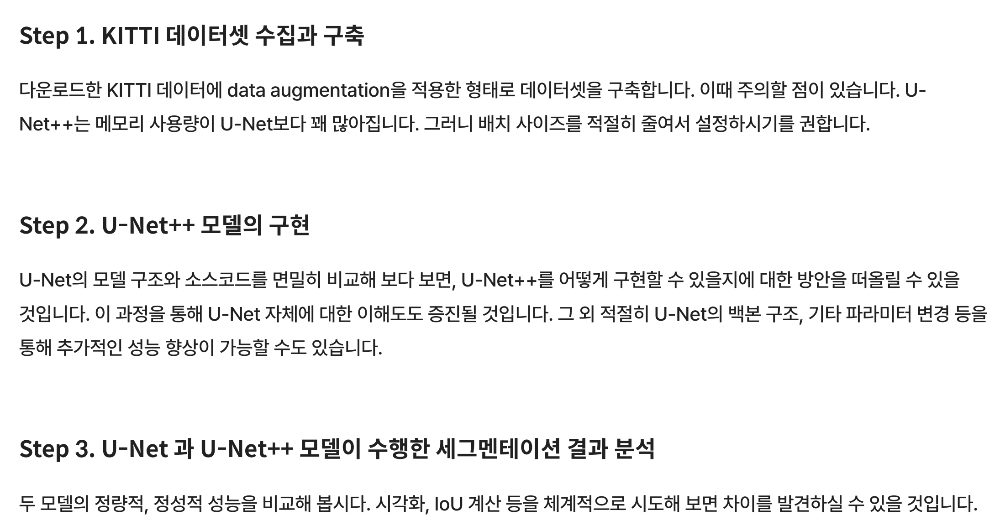

In [1]:
#필요한 라이브러리를 로드합니다. 
import os
import math
import numpy as np
import tensorflow as tf

from PIL import Image
import matplotlib.pyplot as plt
from skimage.io import imread
from skimage.transform import resize
from glob import glob

from tensorflow.keras.models import *
from tensorflow.keras.layers import *
from tensorflow.keras.optimizers import *

from albumentations import  HorizontalFlip, RandomSizedCrop, Compose, OneOf, Resize

def build_augmentation(is_train=True):
    if is_train:    # 훈련용 데이터일 경우
        return Compose([
                    HorizontalFlip(p=0.5),    # 50%의 확률로 좌우대칭
                    RandomSizedCrop(         # 50%의 확률로 RandomSizedCrop
                        min_max_height=(300, 370),
                        w2h_ratio=370/1242,
                        height=224,
                        width=224,
                        p=0.5
                        ),
                    Resize(              # 입력이미지를 224X224로 resize
                        width=224,
                        height=224
                        )
                    ])
    return Compose([      # 테스트용 데이터일 경우에는 224X224로 resize만 수행합니다. 
                Resize(
                    width=224,
                    height=224
                    )
                ])

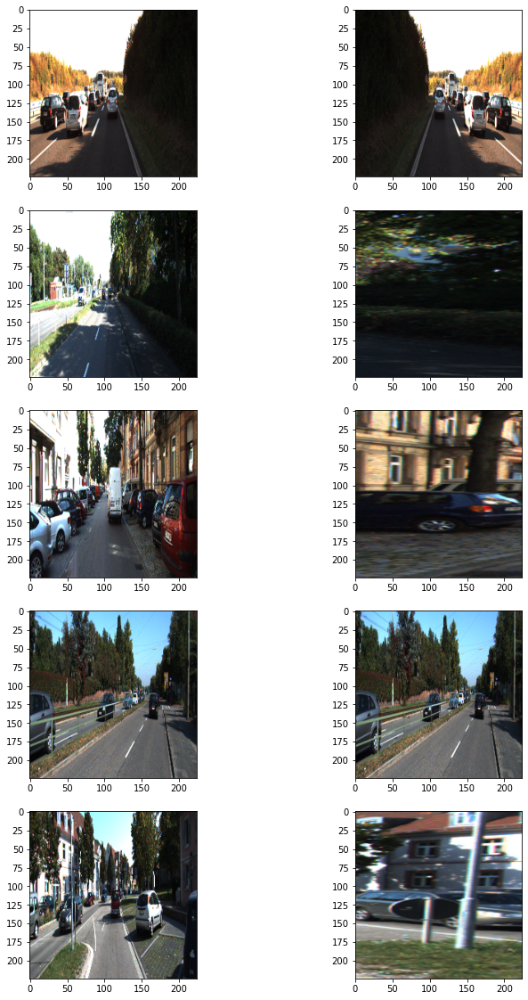

In [2]:
dir_path = os.getenv('HOME')+'/aiffel/semantic_segmentation/data/training'

augmentation_train = build_augmentation()
augmentation_test = build_augmentation(is_train=False)
input_images = glob(os.path.join(dir_path, "image_2", "*.png"))

# 훈련 데이터셋에서 5개만 가져와 augmentation을 적용해 봅시다.  
plt.figure(figsize=(12, 20))
for i in range(5):
    image = imread(input_images[i]) 
    image_data = {"image":image}
    resized = augmentation_test(**image_data)
    processed = augmentation_train(**image_data)
    plt.subplot(5, 2, 2*i+1)
    plt.imshow(resized["image"])  # 왼쪽이 원본이미지
    plt.subplot(5, 2, 2*i+2)
    plt.imshow(processed["image"])  # 오른쪽이 augment된 이미지
  
plt.show()

In [3]:
class KittiGenerator(tf.keras.utils.Sequence):
  
    '''
      KittiGenerator는 tf.keras.utils.Sequence를 상속받습니다.
      우리가 KittiDataset을 원하는 방식으로 preprocess하기 위해서 Sequnce를 커스텀해 사용합니다.
      '''
    def __init__(self, 
               dir_path,
               batch_size=16,
               img_size=(224, 224, 3),
               output_size=(224, 224),
               is_train=True,
               augmentation=None):
        '''
    dir_path: dataset의 directory path입니다.
    batch_size: batch_size입니다.
    img_size: preprocess에 사용할 입력이미지의 크기입니다.
    output_size: ground_truth를 만들어주기 위한 크기입니다.
    is_train: 이 Generator가 학습용인지 테스트용인지 구분합니다.
    augmentation: 적용하길 원하는 augmentation 함수를 인자로 받습니다.
        '''
        self.dir_path = dir_path
        self.batch_size = batch_size
        self.is_train = is_train
        self.dir_path = dir_path
        self.augmentation = augmentation
        self.img_size = img_size
        self.output_size = output_size

    # load_dataset()을 통해서 kitti dataset의 directory path에서 라벨과 이미지를 확인합니다.
        self.data = self.load_dataset()

    def load_dataset(self):
        # kitti dataset에서 필요한 정보(이미지 경로 및 라벨)를 directory에서 확인하고 로드하는 함수입니다.
        # 이때 is_train에 따라 test set을 분리해서 load하도록 해야합니다.
        input_images = glob(os.path.join(self.dir_path, "image_2", "*.png"))
        label_images = glob(os.path.join(self.dir_path, "semantic", "*.png"))
        input_images.sort()
        label_images.sort()
        assert len(input_images) == len(label_images)
        data = [ _ for _ in zip(input_images, label_images)]

        if self.is_train:
            return data[:-30]
        return data[-30:]
    
    def __len__(self):
    # Generator의 length로서 전체 dataset을 batch_size로 나누고 소숫점 첫째자리에서 올림한 값을 반환합니다.
        return math.ceil(len(self.data) / self.batch_size)

    def __getitem__(self, index):
        # 입력과 출력을 만듭니다.
        # 입력은 resize및 augmentation이 적용된 input image이고 
        # 출력은 semantic label입니다.
        batch_data = self.data[
                               index*self.batch_size:
                               (index + 1)*self.batch_size
                               ]
        inputs = np.zeros([self.batch_size, *self.img_size])
        outputs = np.zeros([self.batch_size, *self.output_size])
        
        for i, data in enumerate(batch_data):
            input_img_path, output_path = data
            _input = imread(input_img_path)
            _output = imread(output_path)
            _output = (_output==7).astype(np.uint8)*1
            data = {
                  "image": _input,
                  "mask": _output,
                  }
            augmented = self.augmentation(**data)
            inputs[i] = augmented["image"]/255
            outputs[i] = augmented["mask"]
            return inputs, outputs

    def on_epoch_end(self):
    # 한 epoch가 끝나면 실행되는 함수입니다. 학습중인 경우에 순서를 random shuffle하도록 적용한 것을 볼 수 있습니다.
        self.indexes = np.arange(len(self.data))
        if self.is_train == True :
            np.random.shuffle(self.indexes)
        return self.indexes

In [4]:
augmentation = build_augmentation()
test_preproc = build_augmentation(is_train=False)
        
train_generator = KittiGenerator(
    dir_path, 
    augmentation=augmentation,
)

test_generator = KittiGenerator(
    dir_path, 
    augmentation=test_preproc,
    is_train=False
)

# 모델 구축
- unet과 unet++을 구현

## U-net

In [5]:
def build_unet(input_shape=(224, 224, 3)):
    # 인풋 레이어
    inputs = Input(input_shape)
    
    # 인코더: 다운샘플링 부분
    c1 = Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(inputs)
    c1 = Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c1)
    p1 = MaxPooling2D((2, 2))(c1)
    p1 = Dropout(0.1)(p1)

    c2 = Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p1)
    c2 = Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c2)
    p2 = MaxPooling2D((2, 2))(c2)
    p2 = Dropout(0.1)(p2)

    c3 = Conv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p2)
    c3 = Conv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c3)
    p3 = MaxPooling2D((2, 2))(c3)
    p3 = Dropout(0.2)(p3)

    c4 = Conv2D(512, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p3)
    c4 = Conv2D(512, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c4)
    p4 = MaxPooling2D((2, 2))(c4)
    p4 = Dropout(0.2)(p4)

    # 바틀넥 부분
    c5 = Conv2D(1024, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p4)
    c5 = Conv2D(1024, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c5)
    c5 = Dropout(0.3)(c5)

    # 디코더: 업샘플링 부분
    u6 = Conv2DTranspose(512, (2, 2), strides=(2, 2), padding='same')(c5)
    u6 = concatenate([u6, c4])
    c6 = Conv2D(512, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(u6)
    c6 = Conv2D(512, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c6)
    c6 = Dropout(0.2)(c6)

    u7 = Conv2DTranspose(256, (2, 2), strides=(2, 2), padding='same')(c6)
    u7 = concatenate([u7, c3])
    c7 = Conv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(u7)
    c7 = Conv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c7)
    c7 = Dropout(0.2)(c7)

    u8 = Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same')(c7)
    u8 = concatenate([u8, c2])
    c8 = Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(u8)
    c8 = Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c8)
    c8 = Dropout(0.1)(c8)

    u9 = Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(c8)
    u9 = concatenate([u9, c1])
    c9 = Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(u9)
    c9 = Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c9)
    c9 = Dropout(0.1)(c9)

    # 출력 레이어
    outputs = Conv2D(1, (1, 1), activation='sigmoid')(c9)

    model = Model(inputs=[inputs], outputs=[outputs])
    return model

## 메트릭 (iou, dice ) 추가

In [6]:
from tensorflow.keras import backend as K
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.models import Model
import os

def iou_metric(y_true, y_pred):
    y_true_f = K.flatten(y_true)
    y_pred_f = K.flatten(y_pred)
    intersection = K.sum(K.cast(y_true_f * y_pred_f, 'float32'))
    union = K.sum(K.cast(y_true_f, 'float32')) + K.sum(K.cast(y_pred_f, 'float32')) - intersection
    iou = intersection / (union + K.epsilon())
    return iou

def dice_coef(y_true, y_pred):
    y_true_f = K.flatten(y_true)
    y_pred_f = K.flatten(y_pred)
    intersection = K.sum(y_true_f * y_pred_f)
    return (2. * intersection) / (K.sum(y_true_f) + K.sum(y_pred_f) + K.epsilon())

In [7]:
from tensorflow.keras.callbacks import ModelCheckpoint

# 모델 정의
model = build_unet(input_shape=(224, 224, 3))

# 모델 컴파일
model.compile(optimizer=Adam(1e-4), 
              loss='binary_crossentropy', 
              metrics=[iou_metric, dice_coef])

# 콜백 정의
model_checkpoint = ModelCheckpoint(
    filepath=os.path.join(os.getenv('HOME'), 'aiffel/semantic_segmentation/weights/weights_epoch_{epoch:02d}.h5'),
    save_weights_only=True,  # 가중치만 저장
    verbose=1
)

# 모델 학습
history = model.fit(
    train_generator,
    validation_data=test_generator,
    steps_per_epoch=len(train_generator),
    epochs=200,
    callbacks=[model_checkpoint]
)

Epoch 1/200
11/11 [==============================] - 24s 630ms/step - loss: 0.6840 - iou_metric: 0.0136 - dice_coef: 0.0269 - val_loss: 0.6638 - val_iou_metric: 0.0157 - val_dice_coef: 0.0309

Epoch 00001: saving model to /aiffel/aiffel/semantic_segmentation/weights/weights_epoch_01.h5
Epoch 2/200
11/11 [==============================] - 7s 599ms/step - loss: 0.4963 - iou_metric: 0.0160 - dice_coef: 0.0309 - val_loss: 0.0405 - val_iou_metric: 0.2072 - val_dice_coef: 0.3432

Epoch 00002: saving model to /aiffel/aiffel/semantic_segmentation/weights/weights_epoch_02.h5
Epoch 3/200
11/11 [==============================] - 6s 586ms/step - loss: 0.0359 - iou_metric: 0.1618 - dice_coef: 0.2664 - val_loss: 0.0356 - val_iou_metric: 0.2347 - val_dice_coef: 0.3788

Epoch 00003: saving model to /aiffel/aiffel/semantic_segmentation/weights/weights_epoch_03.h5
Epoch 4/200
11/11 [==============================] - 6s 580ms/step - loss: 0.0352 - iou_metric: 0.2193 - dice_coef: 0.3561 - val_loss: 0.0327

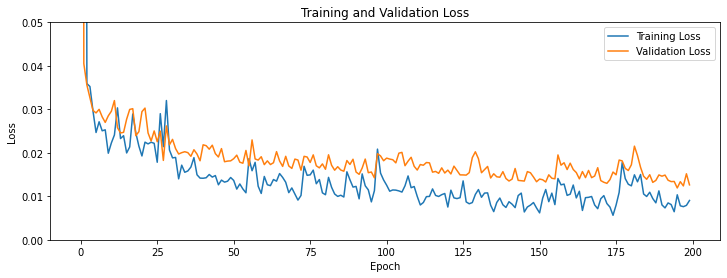

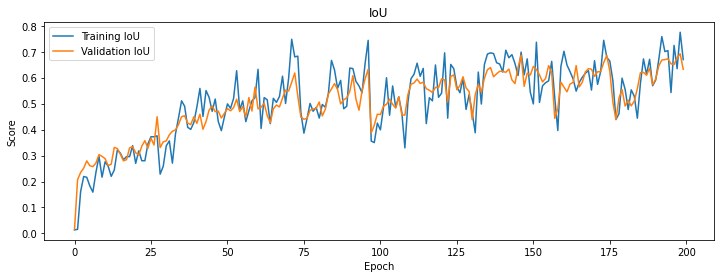

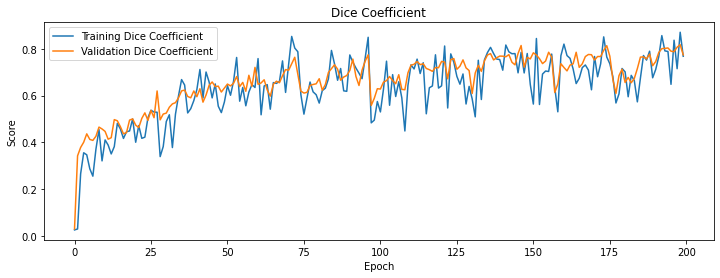

In [8]:
def plot_training_history(history):
    # 손실 그래프
    plt.figure(figsize=(12, 4))
    
    # 학습 손실
    
    plt.plot(history.history['loss'], label='Training Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    plt.title('Training and Validation Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.ylim(0,0.05)
    plt.legend()
    plt.show()
    # IoU 및 Dice coefficient 그래프
    plt.figure(figsize=(12, 4))
    plt.plot(history.history['iou_metric'], label='Training IoU')
    plt.plot(history.history['val_iou_metric'], label='Validation IoU')
    plt.title('IoU')
    plt.xlabel('Epoch')
    plt.ylabel('Score')
    plt.legend()
    plt.show()
    plt.figure(figsize=(12, 4))
    plt.plot(history.history['dice_coef'], label='Training Dice Coefficient')
    plt.plot(history.history['val_dice_coef'], label='Validation Dice Coefficient')
    plt.title('Dice Coefficient')
    plt.xlabel('Epoch')
    plt.ylabel('Score')
    plt.legend()


# 학습 이력 시각화
plot_training_history(history)

## u-net++

In [11]:
def build_unet_pp(input_shape=(224, 224, 3)):
    inputs = Input(input_shape)
    
    # 인코더
    c1 = Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(inputs)
    c1 = Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c1)
    p1 = MaxPooling2D((2, 2))(c1)
    p1 = Dropout(0.1)(p1)

    c2 = Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p1)
    c2 = Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c2)
    p2 = MaxPooling2D((2, 2))(c2)
    p2 = Dropout(0.1)(p2)

    c3 = Conv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p2)
    c3 = Conv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c3)
    p3 = MaxPooling2D((2, 2))(c3)
    p3 = Dropout(0.2)(p3)

    c4 = Conv2D(512, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p3)
    c4 = Conv2D(512, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c4)
    p4 = MaxPooling2D((2, 2))(c4)
    p4 = Dropout(0.2)(p4)

    # 바틀넥
    c5 = Conv2D(1024, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p4)
    c5 = Conv2D(1024, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c5)
    c5 = Dropout(0.3)(c5)

    # 디코더
    u6 = Conv2DTranspose(512, (2, 2), strides=(2, 2), padding='same')(c5)
    u6 = concatenate([u6, c4])
    c6 = Conv2D(512, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(u6)
    c6 = Conv2D(512, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c6)
    c6 = Dropout(0.2)(c6)

    u7 = Conv2DTranspose(256, (2, 2), strides=(2, 2), padding='same')(c6)
    u7 = concatenate([u7, c3])
    c7 = Conv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(u7)
    c7 = Conv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c7)
    c7 = Dropout(0.2)(c7)

    u8 = Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same')(c7)
    u8 = concatenate([u8, c2])
    c8 = Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(u8)
    c8 = Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c8)
    c8 = Dropout(0.1)(c8)

    u9 = Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(c8)
    u9 = concatenate([u9, c1])
    c9 = Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(u9)
    c9 = Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c9)
    c9 = Dropout(0.1)(c9)

    # 출력 레이어
    outputs = Conv2D(1, (1, 1), activation='sigmoid')(c9)

    model = Model(inputs=[inputs], outputs=[outputs])
    return model

In [12]:
# 모델 정의
model_pp = build_unet_pp(input_shape=(224, 224, 3))

# 모델 컴파일
model_pp.compile(optimizer=Adam(1e-4), 
              loss='binary_crossentropy', 
              metrics=[iou_metric, dice_coef])

# 콜백 정의
model_checkpoint = ModelCheckpoint(
    filepath=os.path.join(os.getenv('HOME'), 'aiffel/semantic_segmentation/weights_pp/weights_epoch_{epoch:02d}.h5'),
    save_weights_only=True,  # 가중치만 저장
    verbose=1
)

# 모델 학습
history_pp = model_pp.fit(
    train_generator,
    validation_data=test_generator,
    steps_per_epoch=len(train_generator),
    epochs=200,
    callbacks=[model_checkpoint]
)

Epoch 1/200
11/11 [==============================] - 8s 629ms/step - loss: 0.6851 - iou_metric: 0.0127 - dice_coef: 0.0250 - val_loss: 0.6690 - val_iou_metric: 0.0108 - val_dice_coef: 0.0214

Epoch 00001: saving model to /aiffel/aiffel/semantic_segmentation/weights_pp/weights_epoch_01.h5
Epoch 2/200
11/11 [==============================] - 7s 603ms/step - loss: 0.6345 - iou_metric: 0.0059 - dice_coef: 0.0117 - val_loss: 0.4334 - val_iou_metric: 0.0065 - val_dice_coef: 0.0130

Epoch 00002: saving model to /aiffel/aiffel/semantic_segmentation/weights_pp/weights_epoch_02.h5
Epoch 3/200
11/11 [==============================] - 7s 596ms/step - loss: 0.1642 - iou_metric: 0.0679 - dice_coef: 0.1157 - val_loss: 0.0338 - val_iou_metric: 0.2216 - val_dice_coef: 0.3608

Epoch 00003: saving model to /aiffel/aiffel/semantic_segmentation/weights_pp/weights_epoch_03.h5
Epoch 4/200
11/11 [==============================] - 7s 594ms/step - loss: 0.0366 - iou_metric: 0.1812 - dice_coef: 0.3038 - val_loss

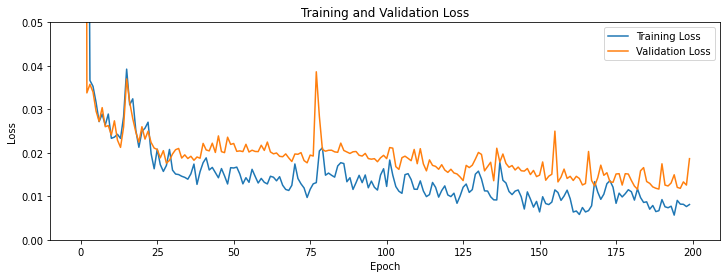

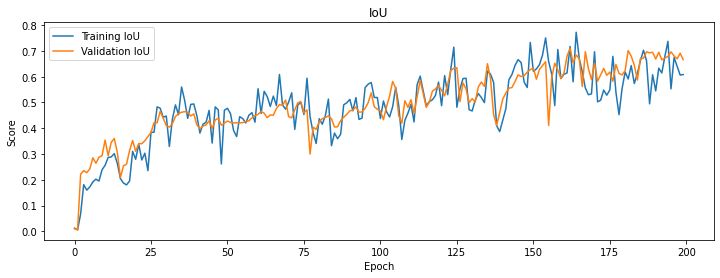

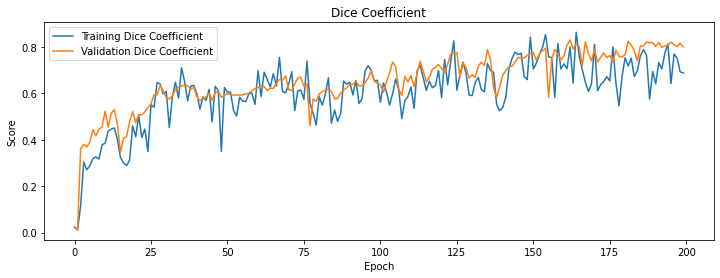

In [13]:
plot_training_history(history_pp)

In [14]:


# UNet의 최고 성능 에포크 찾기
unet_best_epoch_iou = np.argmax(history.history['val_iou_metric']) + 1
unet_best_epoch_dice = np.argmax(history.history['val_dice_coef']) + 1
unet_best_iou = np.max(history.history['val_iou_metric'])
unet_best_dice = np.max(history.history['val_dice_coef'])

# UNet++의 최고 성능 에포크 찾기
unet_pp_best_epoch_iou = np.argmax(history_pp.history['val_iou_metric']) + 1
unet_pp_best_epoch_dice = np.argmax(history_pp.history['val_dice_coef']) + 1
unet_pp_best_iou = np.max(history_pp.history['val_iou_metric'])
unet_pp_best_dice = np.max(history_pp.history['val_dice_coef'])

print(f"UNet: 최고 IoU 성능 에포크 = {unet_best_epoch_iou}, 최고 IoU = {unet_best_iou}")
print(f"UNet: 최고 Dice 성능 에포크 = {unet_best_epoch_dice}, 최고 Dice = {unet_best_dice}")
print(f"UNet++: 최고 IoU 성능 에포크 = {unet_pp_best_epoch_iou}, 최고 IoU = {unet_pp_best_iou}")
print(f"UNet++: 최고 Dice 성능 에포크 = {unet_pp_best_epoch_dice}, 최고 Dice = {unet_pp_best_dice}")

UNet: 최고 IoU 성능 에포크 = 199, 최고 IoU = 0.6916093826293945
UNet: 최고 Dice 성능 에포크 = 199, 최고 Dice = 0.8174500465393066
UNet++: 최고 IoU 성능 에포크 = 163, 최고 IoU = 0.7096455693244934
UNet++: 최고 Dice 성능 에포크 = 163, 최고 Dice = 0.8298161029815674


미세하게 unet++이 더 좋다는 걸 알게 되었다.

# 정성적 평가

In [33]:
from tensorflow.keras.models import load_model

# 경로 설정 (모델 저장 시의 경로를 입력하세요)
base_path = os.path.join(os.getenv('HOME'), 'aiffel/semantic_segmentation')

# UNet의 최고 성능 가중치 로드
unet_best_weights_path = os.path.join(base_path, 'weights/weights_epoch_199.h5')
model_unet = build_unet(input_shape=(224, 224, 3))
model_unet.load_weights(unet_best_weights_path)

# UNet++의 최고 성능 가중치 로드
unet_pp_best_weights_path = os.path.join(base_path, 'weights_pp/weights_epoch_163.h5')
model_unet_pp = build_unet_pp(input_shape=(224, 224, 3))
model_unet_pp.load_weights(unet_pp_best_weights_path)

## unet

In [34]:
def get_output(model, preproc, image_path, output_path):
    origin_img = imread(image_path)
    data = {"image":origin_img}
    processed = preproc(**data)
    output = model(np.expand_dims(processed["image"]/255,axis=0))
    output = (output[0].numpy()>0.5).astype(np.uint8).squeeze(-1)*255  #0.5라는 threshold를 변경하면 도로인식 결과범위가 달라집니다.
    output = Image.fromarray(output)
    background = Image.fromarray(origin_img).convert('RGBA')
    output = output.resize((origin_img.shape[1], origin_img.shape[0])).convert('RGBA')
    output = Image.blend(background, output, alpha=0.5)
    output.show()
    return output

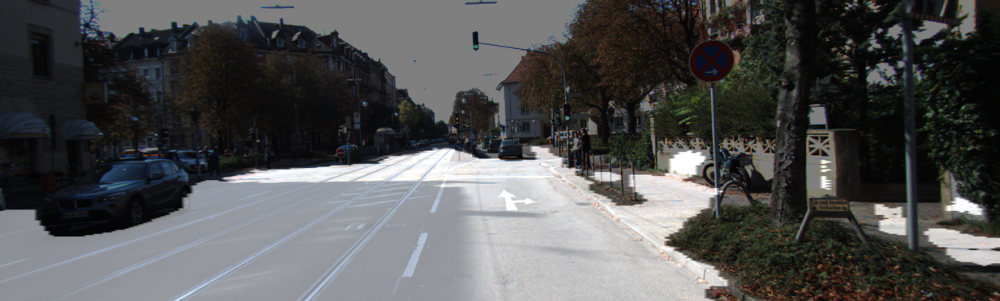

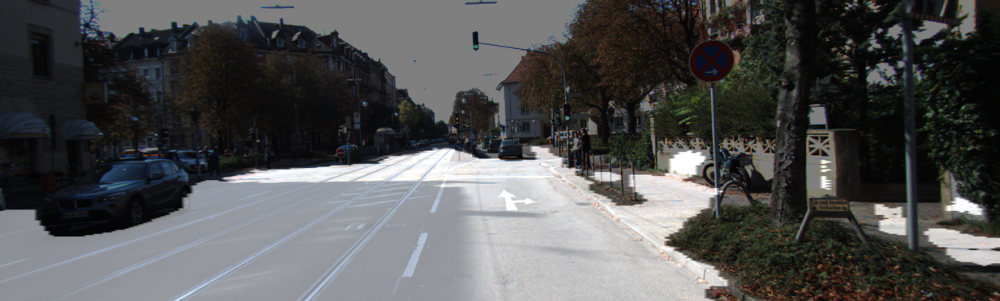

In [35]:
i = 1    # i값을 바꾸면 테스트용 파일이 달라집니다. 
get_output(
     model, 
     test_preproc,
     image_path=dir_path + f'/image_2/00{str(i).zfill(4)}_10.png',
     output_path=dir_path + f'./result_{str(i).zfill(3)}.png'
 )

In [36]:
def calculate_iou_score(target, prediction):
    # 이진화된 두 마스크의 교집합을 계산
    intersection = np.logical_and(target, prediction).sum()
    
    # 이진화된 두 마스크의 합집합을 계산
    union = np.logical_or(target, prediction).sum()
    
    # IoU 점수 계산
    iou_score = float(intersection) / float(union) if union != 0 else 0.0
    
    print('IoU : %f' % iou_score)
    return iou_score

In [37]:
def get_output(model, preproc, image_path, output_path, label_path):
    origin_img = imread(image_path)
    data = {"image":origin_img}
    processed = preproc(**data)
    output = model(np.expand_dims(processed["image"]/255,axis=0))
    output = (output[0].numpy()>=0.5).astype(np.uint8).squeeze(-1)*255  #0.5라는 threshold를 변경하면 도로인식 결과범위가 달라집니다.
    prediction = output/255   # 도로로 판단한 영역
    
    output = Image.fromarray(output)
    background = Image.fromarray(origin_img).convert('RGBA')
    output = output.resize((origin_img.shape[1], origin_img.shape[0])).convert('RGBA')
    output = Image.blend(background, output, alpha=0.5)
    output.show()   # 도로로 판단한 영역을 시각화!
     
    if label_path:   
        label_img = imread(label_path)
        label_data = {"image":label_img}
        label_processed = preproc(**label_data)
        label_processed = label_processed["image"]
        target = (label_processed == 7).astype(np.uint8)*1   # 라벨에서 도로로 기재된 영역

        return output, prediction, target
    else:
        return output, prediction, _

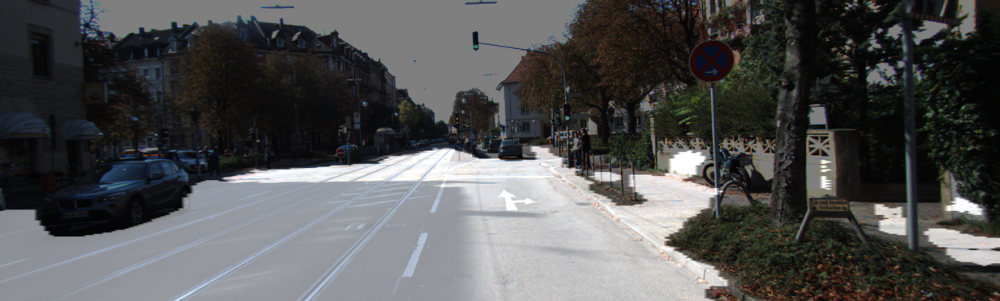

IoU : 0.852146


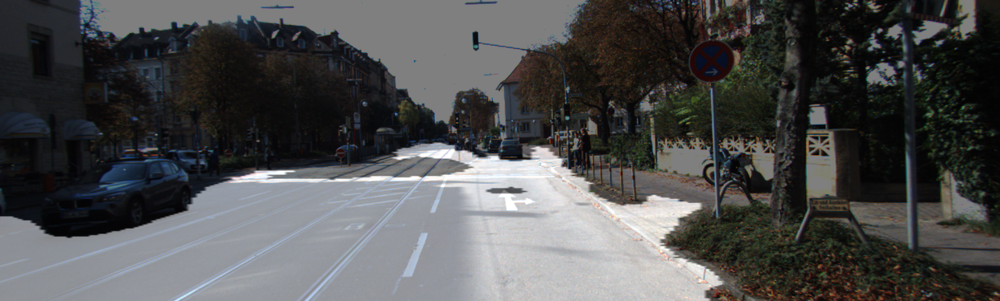

IoU : 0.878678


0.8786783686112545

In [52]:
i = 1    # i값을 바꾸면 테스트용 파일이 달라집니다. 
output, prediction, target = get_output(
     model, 
     test_preproc,
     image_path=dir_path + f'/image_2/00{str(i).zfill(4)}_10.png',
     output_path=dir_path + f'./result_{str(i).zfill(3)}.png',
     label_path=dir_path + f'/semantic/00{str(i).zfill(4)}_10.png'
 )

calculate_iou_score(target, prediction)

output, prediction, target = get_output(
     model_pp, 
     test_preproc,
     image_path=dir_path + f'/image_2/00{str(i).zfill(4)}_10.png',
     output_path=dir_path + f'./result_{str(i).zfill(3)}.png',
     label_path=dir_path + f'/semantic/00{str(i).zfill(4)}_10.png'
 )

calculate_iou_score(target, prediction)

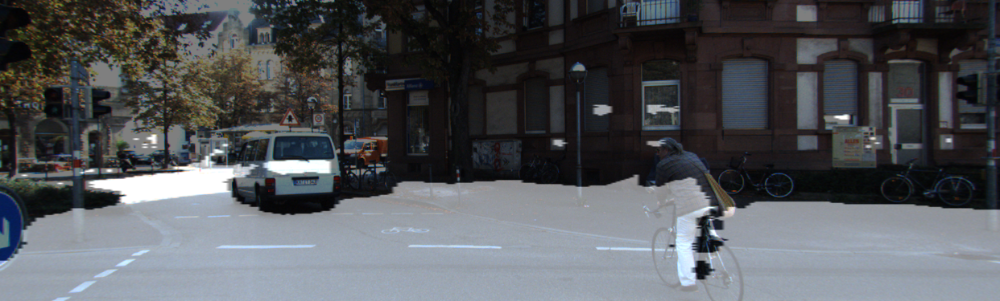

IoU : 0.623051


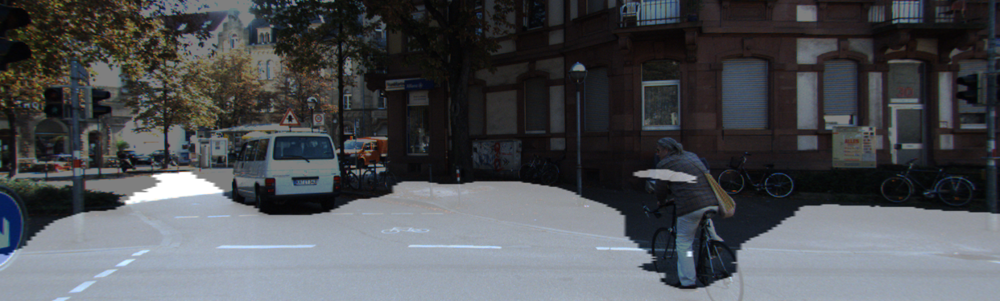

IoU : 0.688991


0.6889912889786644

In [51]:
i = 2    # i값을 바꾸면 테스트용 파일이 달라집니다. 
output, prediction, target = get_output(
     model, 
     test_preproc,
     image_path=dir_path + f'/image_2/00{str(i).zfill(4)}_10.png',
     output_path=dir_path + f'./result_{str(i).zfill(3)}.png',
     label_path=dir_path + f'/semantic/00{str(i).zfill(4)}_10.png'
 )

calculate_iou_score(target, prediction)

output, prediction, target = get_output(
     model_pp, 
     test_preproc,
     image_path=dir_path + f'/image_2/00{str(i).zfill(4)}_10.png',
     output_path=dir_path + f'./result_{str(i).zfill(3)}.png',
     label_path=dir_path + f'/semantic/00{str(i).zfill(4)}_10.png'
 )

calculate_iou_score(target, prediction)

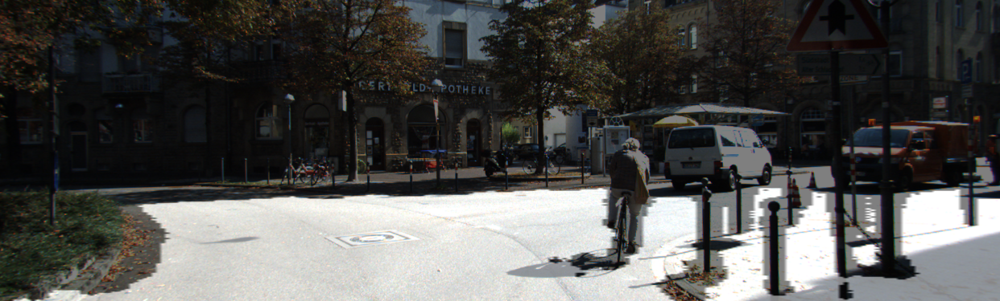

IoU : 0.613903


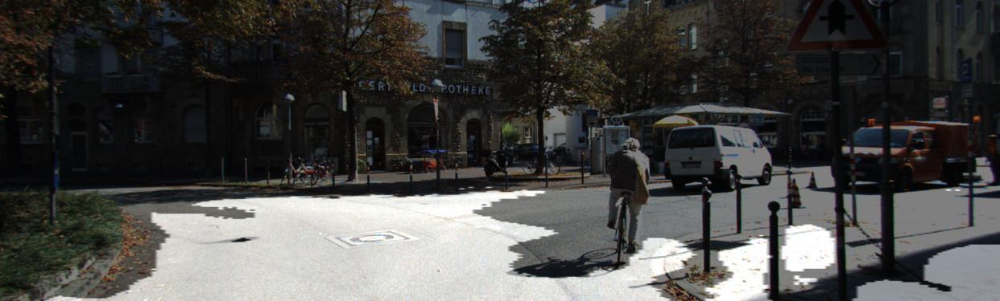

IoU : 0.543772


0.5437723526667704

In [50]:
i = 3    # i값을 바꾸면 테스트용 파일이 달라집니다. 
output, prediction, target = get_output(
     model, 
     test_preproc,
     image_path=dir_path + f'/image_2/00{str(i).zfill(4)}_10.png',
     output_path=dir_path + f'./result_{str(i).zfill(3)}.png',
     label_path=dir_path + f'/semantic/00{str(i).zfill(4)}_10.png'
 )

calculate_iou_score(target, prediction)


output, prediction, target = get_output(
     model_pp, 
     test_preproc,
     image_path=dir_path + f'/image_2/00{str(i).zfill(4)}_10.png',
     output_path=dir_path + f'./result_{str(i).zfill(3)}.png',
     label_path=dir_path + f'/semantic/00{str(i).zfill(4)}_10.png'
 )

calculate_iou_score(target, prediction)

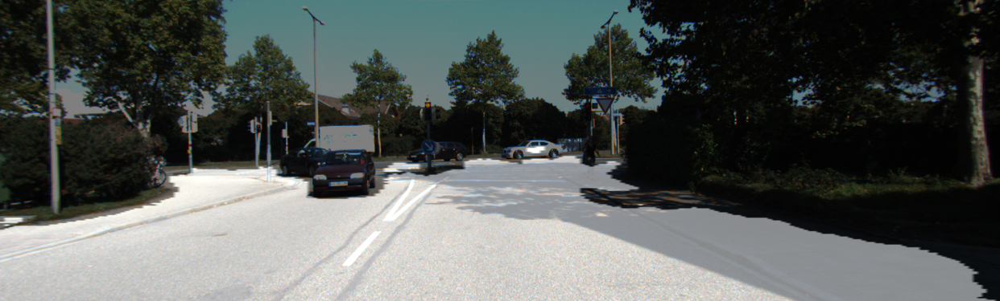

IoU : 0.734597


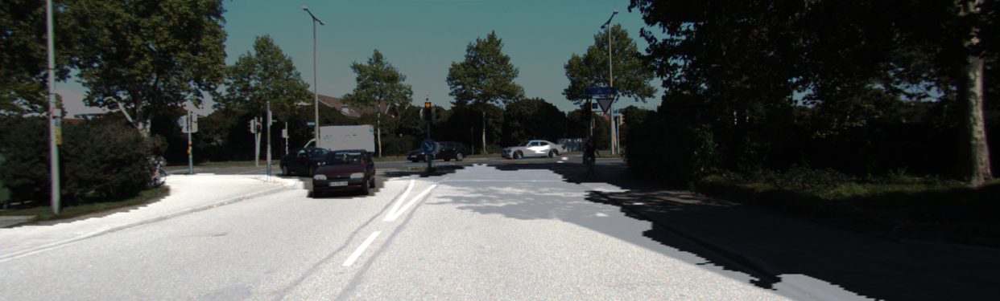

IoU : 0.822489


0.8224885844748858

In [49]:
i = 7   # i값을 바꾸면 테스트용 파일이 달라집니다. 
output, prediction, target = get_output(
     model, 
     test_preproc,
     image_path=dir_path + f'/image_2/00{str(i).zfill(4)}_10.png',
     output_path=dir_path + f'./result_{str(i).zfill(3)}.png',
     label_path=dir_path + f'/semantic/00{str(i).zfill(4)}_10.png'
 )

calculate_iou_score(target, prediction)

output, prediction, target = get_output(
     model_pp, 
     test_preproc,
     image_path=dir_path + f'/image_2/00{str(i).zfill(4)}_10.png',
     output_path=dir_path + f'./result_{str(i).zfill(3)}.png',
     label_path=dir_path + f'/semantic/00{str(i).zfill(4)}_10.png'
 )

calculate_iou_score(target, prediction)

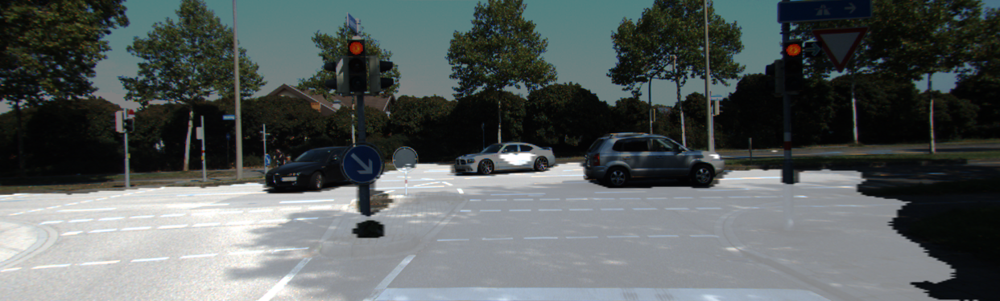

IoU : 0.728734


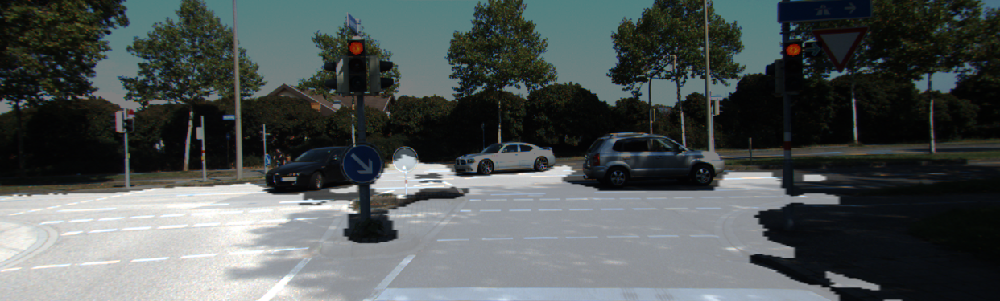

IoU : 0.804906


0.8049063991190505

In [48]:
i = 10    # i값을 바꾸면 테스트용 파일이 달라집니다. 
output, prediction, target = get_output(
     model, 
     test_preproc,
     image_path=dir_path + f'/image_2/00{str(i).zfill(4)}_10.png',
     output_path=dir_path + f'./result_{str(i).zfill(3)}.png',
     label_path=dir_path + f'/semantic/00{str(i).zfill(4)}_10.png'
 )

calculate_iou_score(target, prediction)

i = 10    # i값을 바꾸면 테스트용 파일이 달라집니다. 
output, prediction, target = get_output(
     model_pp, 
     test_preproc,
     image_path=dir_path + f'/image_2/00{str(i).zfill(4)}_10.png',
     output_path=dir_path + f'./result_{str(i).zfill(3)}.png',
     label_path=dir_path + f'/semantic/00{str(i).zfill(4)}_10.png'
 )

calculate_iou_score(target, prediction)
